# Knee Testing

## Setup

In [35]:
using Suppressor
using BM3D
using Images: assess_psnr, rmse, imROF
using TestImages
using MIRT: jim, pogm_restart
using PyCall
using Plots: plot, plot!, savefig
using Noise: add_gauss
using LaTeXStrings

np = pyimport("numpy")
cv = pyimport_conda("cv2", "opencv")
# Inclucde needed files
include("admm.jl")
include("load_fastmri_data.jl")
include("system_ops.jl")
include("create_sampling_mask.jl")
include("utils.jl")
include("primal.jl")
@suppress include("dncnn.jl") # Suppress weight printing

# Create a single Julia function for calling nlmeans
function nlMeans(img::Array{Float64, 2}, h::Number = 3) 
    pyimg = np.uint8(convert(Array{UInt8,2}, floor.(img/max(img...)*255))) # Convert julia image to np.uint8 array
    img_denoised = float32.(cv.fastNlMeansDenoising(pyimg, h=h)) ./ 255
end

function nlMeans(img::Array{Float32, 2}, h::Number = 3) 
    pyimg = np.uint8(convert(Array{UInt8,2}, floor.(img/max(img...)*255))) # Convert julia image to np.uint8 array
    img_denoised = float32.(cv.fastNlMeansDenoising(pyimg, h=h)) ./ 255
end
# Useful to flip images
function rev(img::AbstractArray{T, 2}) where T
    img[end:-1:1, end:-1:1]
end

normIm = (x) -> abs.(x) |> (x) -> x/max(x...); 

In [2]:
# Make a dictionary of the priors
plugs = Dict(
    "dncnn" => (x)          -> normIm( dncnn_denoise(float32.(abs.(x))) ),
    "tv"    => (x, λ, iter) -> normIm( imROF(abs.(x), λ, iter) ),
    "nlm"   => (x, h)       -> normIm( nlMeans(abs.(x), h) ),
    "norm"  => (x)          -> normIm(x),
    "bm3d"  => (x, h)       -> normIm( bm3d(abs.(x), h) )
    );

In [167]:
# Choose test files
fNames = [
    "file1000000.h5"
    "file1000007.h5"
    "file1000017.h5"
    "file1000026.h5"
    "file1000031.h5"
];

In [283]:
# Number of iterations
nIter = 10

10

# Create undersampled data sets

### Load the data

In [37]:
useFastMRI = true
nImgs = length(fNames)
imgs        = Array{Any}(undef, nImgs)
noisy_imgs  = Array{Any}(undef, nImgs)
for i = 1:nImgs
    # Load a fully sampled image
    fName = fNames[i] # File name
#     fPath = joinpath(pwd(), "data", fName) # Full file path
    fPath = joinpath(dirname(pwd()), "data", fName) # Full file path
    # Load naturally noisy image
    noisy_img = abs.(load_fastmri_data(fPath))
    # Use a denoised image b/c PnP denoises
    img = normIm( nlMeans(noisy_img, 3) )
    # Optionally add more noise
    noisy_img = add_gauss(img, 0.05);
    # Store
    imgs[i] = img
    noisy_imgs[i] = noisy_img
end

In [194]:
plotImg = Array{Any}(undef, nImgs, 2)
for i = 1:nImgs
    plotImg[i, 1] = jim(abs.(rev(imgs[i])))
    noisyPSNR = assess_psnr(noisy_imgs[i], imgs[i]) |> (x) -> round(x, digits = 2)
    plotImg[i, 2] = jim(abs.(rev(noisy_imgs[i])), title = "PSNR = $noisyPSNR")
end
plot!(plotImg[1, 1], ylabel = "Reference")
plot!(plotImg[1, 2], ylabel = "Noisy Reference")
plot(plotImg..., layout = (2, nImgs), colorbar = false, size = (900,700), titlefontsize = 10)

In [353]:
# Adjust ref. img plot
plot(plotImg[1, 1:2]... , ylabel = "")
plot(plotImg[:]..., title = "Reference");

### Create Sampling Masks

In [174]:
testR = [1, 4, 8, 12]
nR = length(testR)
sampleMasks = Dict{typeof((1,1,1)), Any}()
# Specify acceleration factor for sampling mask
for i = 1:nImgs, R in testR
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Don't recreate mask
    if haskey(sampleMasks, key)
        continue
    end
    # Use caution with R = 1 
    if R == 1
        sampleMask = ones(Bool, M, N)
        M_us = M
    else
        M_us = Int(round(M/R)) # Undersampled number of points
        # Create a 1D random undersampling mask
        sampleMask = create_sampling_mask(M, N, R, seed=0)
    end
    push!(sampleMasks, key => sampleMask)
end


### Plot the masks

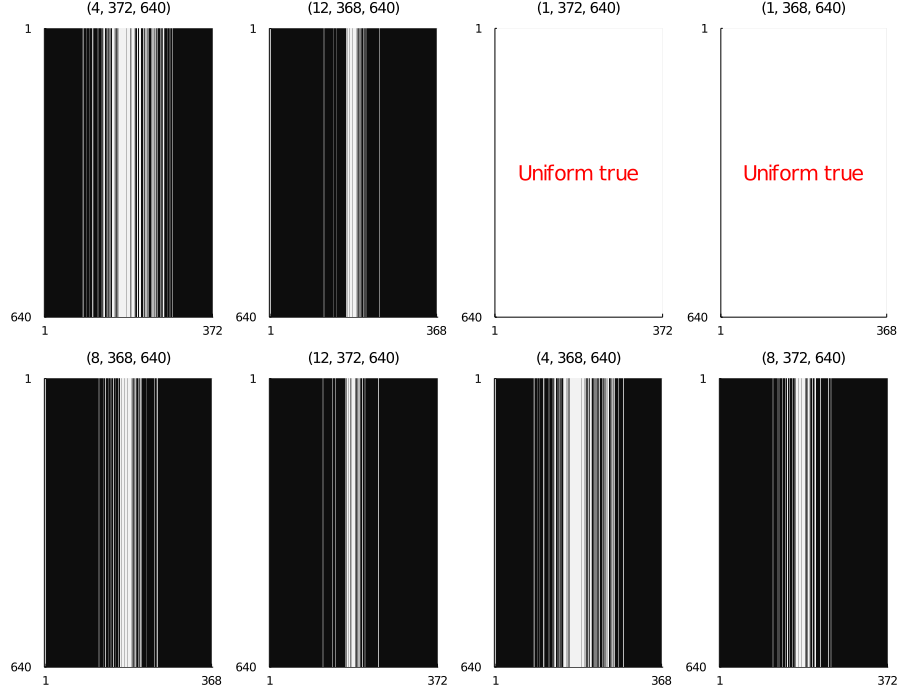

In [198]:
plotMasks = Array{Any}(undef, 0)
for (key, mask) in sampleMasks
    push!(plotMasks, jim(mask, title = "$key"))
end
plot(plotMasks..., layout = (2, :), colorbar = false, size = (900,700), titlefontsize = 10)

### Create the Models

In [176]:
A = Dict{typeof((1,1,1)), LinearMapAM{Float32,1,1}}()
for (key, mask) in sampleMasks
    (R, M, N) = key # Alias
    # Determine number of under sampled points
    M_us = Int(round(M/R))
    # Create linear map, A, that describes the MRI system model
    Akey = LinearMapAA(x -> sys_forw(x, mask), x -> sys_adj(x, mask), (M_us*N, M*N))
    push!(A, key => Akey)
end

### Generate (undersampled) k-space and adjoint recon

In [177]:
# Initialize
y  = Array{Any}(undef, nImgs, nR) # k-space
x0 = Array{Any}(undef, nImgs, nR) # adj. recon
psnrAdjoint = Array{Any}(undef, nImgs, nR) # psnr
plotAdjoint = Array{Any}(undef, nImgs, nR) # plot matrix
# Loop over images and accel. factors
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Apply model to image -> undersampled k-space
    y[i, iR]  = A[key]*noisy_imgs[i][:]
    # Applying adjoint model to k-space reconstructs the image (poorly)
    x0[i, iR] = normIm( reshape(A[key]'*y[i, iR] , M, N) )
    # Calculate PSNR
    psnrAdjoint[i, iR] = assess_psnr(x0[i, iR], imgs[i]) # PSNR
    # Generate plot
    tit = """Adjoint, PSNR = $(round(psnrAdjoint[i, iR], digits = 2))
             R=$R
          """
#     "Adjoint recon, PSNR = $(round(psnrAdjoint, digits = 2))"
    plotAdjoint[i, iR] = jim(rev(x0[i, iR]), title=tit)
    plot!(xlim = (1, M))
end
# # Make some plots
# psnrAdjoint = assess_psnr(x0, img) # PSNR
# j1 = jim(abs.(rev(img)),title="Reference")
# j2 = jim(rev(x0),title="Adjoint recon, PSNR = $(round(psnrAdjoint, digits = 2))")
# plot(j1, j2)

In [351]:
# Choose a image to plot
i = 2
plot(plotImg[i], plotAdjoint[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

## Plug and Play!

In [331]:
meth  = Dict("admm" => 1, "pogm" => 2)
dummy = Array{Any}(undef, nImgs, nR)
x̂     = Dict((plug_, meth_) => copy(dummy) for (plug_, :) in plugs for (meth_, :) in meth)
PSNR  = Dict((plug_, meth_) => copy(dummy) for (plug_, :) in plugs for (meth_, :) in meth)
RMSE  = Dict((plug_, meth_) => copy(dummy) for (plug_, :) in plugs for (meth_, :) in meth);

### Using DNCNN

In [ ]:
# Setup the plug
plug = (x)-> plugs["dncnn"](x)
sKey = ("dncnn", "admm")
# Reconstruct
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    R == 1 ? print("Image $i\n") : () # Simple feedback
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Extract x0, A, y, mask, image
    _x0 = x0[i, iR]
    _y  = y[i, iR]
    _A  = A[key]
    _mask = sampleMasks[key]
    _img  = imgs[i]
    # Do admm
    _x̂, _rmse = @suppress admm(
        (z,η,μ) -> primal(z, η, μ, _A, _mask, _y),
        plug,
        1,
        _x0, 
        niter = nIter,
        fun = (x, iter) -> rmse(x, _img[:])
    )
    # Reshape and normalize
    _x̂ = normIm( reshape(abs.(_x̂), M, N) )
    # Calculate psnr
    _psnr = assess_psnr(_x̂, _img)
    # Assign outputs
    x̂[sKey][i, iR] = _x̂
    PSNR[sKey][i, iR] = _psnr
    RMSE[sKey][i, iR] = _rmse
end

Image 1


In [ ]:
plotNorm = Array{Any}(undef, nImgs, nR)
sKey = ("dncnn", "admm")
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    _psnr = round(PSNR[sKey][i, iR], digits = 2)
    plotNorm[i, iR] = jim(
        rev(x̂[sKey][i, iR]),
        title = "NLMeans, PSNR = $_psnr \n R = $R"
    )
    plot!(xlim = (1, M))
end

In [ ]:
i = 2
plot(plotImg[i], plotNorm[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

### Using TV

In [46]:
# Setup the plug
λ = 0.002
tvIter = 4
plug = (x) -> plugs["tv"](x, λ, tvIter)
sKey = ("tv", "admm")
# Reconstruct
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    R == 1 ? print("Image $i\n") : () # Simple feedback
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Extract x0, A, y, mask, image
    _x0 = x0[i, iR]
    _y  = y[i, iR]
    _A  = A[key]
    _mask = sampleMasks[key]
    _img  = imgs[i]
    # Do admm
    _x̂, _rmse = @suppress admm(
        (z,η,μ) -> primal(z, η, μ, _A, _mask, _y),
        plug,
        1,
        _x0, 
        niter = nIter,
        fun = (x, iter) -> rmse(x, _img[:])
    )
    # Reshape and normalize
    _x̂ = normIm( reshape(abs.(_x̂), M, N) )
    # Calculate psnr
    _psnr = assess_psnr(_x̂, _img)
    # Assign outputs
    x̂[sKey][i, iR] = _x̂
    PSNR[sKey][i, iR] = _psnr
    RMSE[sKey][i, iR] = _rmse
end

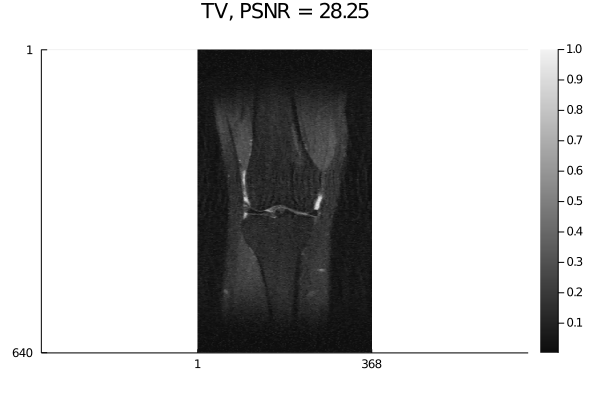

In [47]:
plotNorm = Array{Any}(undef, nImgs, nR)
sKey = ("tv", "admm")
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    _psnr = round(PSNR[sKey][i, iR], digits = 2)
    plotNorm[i, iR] = jim(
        rev(x̂[sKey][i, iR]),
        title = "NLMeans, PSNR = $_psnr \n R = $R"
    )
    plot!(xlim = (1, M))
end

In [ ]:
i = 2
plot(plotImg[i], plotNorm[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

### Using NLMeans

In [358]:
# Setup the plug
h = 3.0
plug = (x) -> plugs["nlm"](x, h)
sKey = ("nlm", "admm")
# Reconstruct
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    R == 1 ? print("Image $i\n") : () # Simple feedback
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Extract x0, A, y, mask, image
    _x0 = x0[i, iR]
    _y  = y[i, iR]
    _A  = A[key]
    _mask = sampleMasks[key]
    _img  = imgs[i]
    # Do admm
    _x̂, _rmse = @suppress admm(
        (z,η,μ) -> primal(z, η, μ, _A, _mask, _y),
        plug,
        1,
        _x0, 
        niter = nIter,
        fun = (x, iter) -> rmse(x, _img[:])
    )
    # Reshape and normalize
    _x̂ = normIm( reshape(abs.(_x̂), M, N) )
    # Calculate psnr
    _psnr = assess_psnr(_x̂, _img)
    # Assign outputs
    x̂[sKey][i, iR] = _x̂
    PSNR[sKey][i, iR] = _psnr
    RMSE[sKey][i, iR] = _rmse
end

Image 1
Image 2
Image 3
Image 4
Image 5


In [359]:
plotNorm = Array{Any}(undef, nImgs, nR)
sKey = ("nlm", "admm")
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    _psnr = round(PSNR[sKey][i, iR], digits = 2)
    plotNorm[i, iR] = jim(
        rev(x̂[sKey][i, iR]),
        title = "NLMeans, PSNR = $_psnr \n R = $R"
    )
    plot!(xlim = (1, M))
end

In [360]:
i = 2
plot(plotImg[i], plotNorm[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

### Using BM3D

In [50]:
# Setup plug
h    = 0.08
plug = (x) -> @suppress plugs["bm3d"](x, h)
sKey = ("bm3d", "admm")
# Reconstruct
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    R == 1 ? print("Image $i\n") : () # Simple feedback
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Extract x0, A, y, mask, image
    _x0 = x0[i, iR]
    _y  = y[i, iR]
    _A  = A[key]
    _mask = sampleMasks[key]
    _img  = imgs[i]
    # Do admm
    _x̂, _rmse = @suppress admm(
        (z,η,μ) -> primal(z, η, μ, _A, _mask, _y),
        plug,
        1,
        _x0, 
        niter = nIter,
        fun = (x, iter) -> rmse(x, _img[:])
    )
    # Reshape and normalize
    _x̂ = normIm( reshape(abs.(_x̂), M, N) )
    # Calculate psnr
    _psnr = assess_psnr(_x̂, _img)
    # Assign outputs
    x̂[sKey][i, iR] = _x̂
    PSNR[sKey][i, iR] = _psnr
    RMSE[sKey][i, iR] = _rmse
end

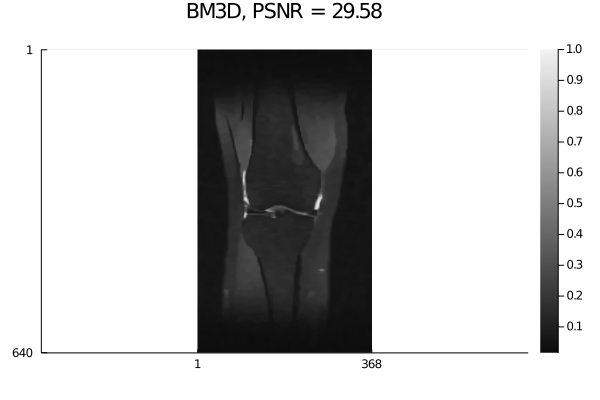

In [51]:
plotNorm = Array{Any}(undef, nImgs, nR)
sKey = ("bm3d", "admm")
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    _psnr = round(PSNR[sKey][i, iR], digits = 2)
    plotNorm[i, iR] = jim(
        rev(x̂[sKey][i, iR]),
        title = "NLMeans, PSNR = $_psnr \n R = $R"
    )
    plot!(xlim = (1, M))
end

In [ ]:
i = 2
plot(plotImg[i], plotNorm[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

### Using normalization

In [332]:
# Setup the plug
plug = plugs["norm"]
sKey = ("norm", "admm")
# Reconstruct
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    R == 1 ? print("Image $i\n") : () # Simple feedback
    (M, N) = size(imgs[i])
    key = (R, M, N)
    # Extract x0, A, y, mask, image
    _x0 = x0[i, iR]
    _y  = y[i, iR]
    _A  = A[key]
    _mask = sampleMasks[key]
    _img  = imgs[i]
    # Do admm
    _x̂, _rmse = @suppress admm(
        (z,η,μ) -> primal(z, η, μ, _A, _mask, _y),
        plug,
        1,
        _x0, 
        niter = nIter,
        fun = (x, iter) -> rmse(x, _img[:])
    )
    # Reshape and normalize
    _x̂ = normIm( reshape(abs.(_x̂), M, N) )
    # Calculate psnr
    _psnr = assess_psnr(_x̂, _img)
    # Assign outputs
    x̂[sKey][i, iR] = _x̂
    PSNR[sKey][i, iR] = _psnr
    RMSE[sKey][i, iR] = _rmse
end

Image 1
Image 2
Image 3
Image 4
Image 5


In [355]:
plotNorm = Array{Any}(undef, nImgs, nR)
sKey = ("norm", "admm")
for i = 1:nImgs, iR in 1:nR
    R = testR[iR]
    (M, N) = size(imgs[i])
    _psnr = round(PSNR[sKey][i, iR], digits = 2)
    plotNorm[i, iR] = jim(
        rev(x̂[sKey][i, iR]),
        title = "Norm, PSNR = $_psnr \n R = $R"
    )
    plot!(xlim = (1, M))
end

In [356]:
i = 2
plot(plotImg[i], plotNorm[i, :]..., layout = (1, :), colorbar = false, size = (900, 300), titlefontsize = 10)

In [64]:
# psnrNoisey = assess_psnr(noisy_img, img) # PSNR
# pNoisey = jim(abs.(rev(noisy_img)),title="Noisy input, PSNR = $(round(psnrNoisey, digits = 2))");
# # blank1 = plot([], axis=([], false), legend=false);
# # blank2 = plot([], axis=([], false), legend=false);
# plot(j1, pNoisey, j2, pDNCNN, pNLMeans, pBM3D, pTv, pNorm, layout = (2,4), colorbar = false, size = (900,700), titlefontsize = 10)

In [69]:
# savefig("pogm_knee_R8_norm.pdf")

Figures:
    example sample masks (4, 8, 12)
    convergence rates 
        - rmse/psnr v. iter
    plug vs knees
    one knee (one plug, one R, admm v pogm)
    nlmeans vs h (one knee, one R)
    table of psnr
    all for one knee (plug by R by admm)